In [1]:
import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import importlib

from GPModel import build_model as GP
from GPModel import fc_data_branching_v3 as fdb
from GPModel import functions_v2 as fcs
from GPModel import objFun as obf
from GPModel import utils

hi model with linear80
hi model with nolinear9
hi fcs2
hii obj30
hii fdb39


# generate data

In [2]:
generateFun = obf.real_objs2('./data/real/ex.csv')

In [3]:
generateFun.data

,baseThick,upperHeight,fanType,baseMaterial,upperType,pinRadius,pinRadiusTop,yMax,yMean
0,2.2,16,exhaust,aluminum,cone,2.2,1.5,105.20,103.0
1,2.2,16,exhaust,aluminum,cone,2.2,1.6,106.30,104.0
2,2.2,16,exhaust,aluminum,cone,2.2,1.7,107.70,106.0
3,2.2,16,exhaust,aluminum,cone,2.2,1.8,108.90,107.0
4,2.2,16,exhaust,aluminum,cone,2.2,1.9,109.60,108.0
...,...,...,...,...,...,...,...,...,...
10795,3.0,32,exhaust,silver,cylinder,3.2,0.0,66.64,66.0
10796,3.0,32,exhaust,silver,cylinder,3.4,0.0,65.72,65.1
10797,3.0,32,exhaust,silver,cylinder,3.6,0.0,65.61,65.0
10798,3.0,32,exhaust,silver,cylinder,3.8,0.0,65.44,64.8


In [2]:
importlib.reload(obf)
importlib.reload(utils)
modelType = {'QnShareFactors':2,    # 定量共享數量
            'QlShareFactors':2,     # 定性共享樹樣
            'BranchingFactors':1,   # 分支因子數量
            'NestedFactors':[2],    # 對應分支因子的巢狀因子數量
            'NFwithBFL':[[1, 2]],    # 對應分支因子下不同level巢狀因子數量
            'QlShareLevels':[2, 4],    # 定性共享 level數量
            'BranchingLevels':[2],     # 分支因子水準
            }

ns = 5
ndatas = [50, 5]
generateFun = obf.initial_datas_v3_3
# generateFun = obf.real_objs2('./data/real/ex.csv')
data = utils.data_generate(ns, ndatas, generateFun, modelType)

hii obj30


# real data 箱型圖

In [25]:
importlib.reload(utils)
datas = utils.real_data_boxplot()
labels = datas['qualitaives'].unique().tolist()
labels

['steel&cylinder',
 'aluminum&cylinder',
 'brass&cylinder',
 'silver&cylinder',
 'aluminum&cone',
 'brass&cone',
 'steel&cone',
 'silver&cone']

In [26]:
import pandas as pd
baseMaterial = ['aluminum', 'brass', 'steel', 'silver']
def datasReplace(data, b):
    A, B = datas.iloc[:1800, :], datas.iloc[1800:9000, :]
    d = []
    for i, c in enumerate(b):
        x = (A['baseMaterial'] == c).tolist()
        d.append(A.iloc[x, :])
    
    for i, c in enumerate(b):
        x = (B['baseMaterial'] == c).tolist()
        d.append(B.iloc[x, :])
        
    return pd.concat(d, axis=0)

In [27]:
datas = datasReplace(datas, baseMaterial)
datas

,baseThick,upperHeight,fanType,baseMaterial,upperType,pinRadius,pinRadiusTop,qualitaives,yMean,yMax
9090,2.2,16,exhaust,aluminum,cylinder,2.2,0.0,aluminum&cylinder,111.0,112.80
9091,2.2,16,exhaust,aluminum,cylinder,2.4,0.0,aluminum&cylinder,110.0,111.50
9092,2.2,16,exhaust,aluminum,cylinder,2.6,0.0,aluminum&cylinder,109.0,110.30
9093,2.2,16,exhaust,aluminum,cylinder,2.8,0.0,aluminum&cylinder,108.0,109.50
9094,2.2,16,exhaust,aluminum,cylinder,3.0,0.0,aluminum&cylinder,107.0,108.90
...,...,...,...,...,...,...,...,...,...,...
7195,2.2,32,exhaust,silver,cone,4.0,1.5,silver&cone,59.3,61.53
7196,2.2,32,exhaust,silver,cone,4.0,1.6,silver&cone,59.2,61.26
7197,2.2,32,exhaust,silver,cone,4.0,1.7,silver&cone,57.9,58.80
7198,2.2,32,exhaust,silver,cone,4.0,1.8,silver&cone,58.0,58.91


hi fcs2


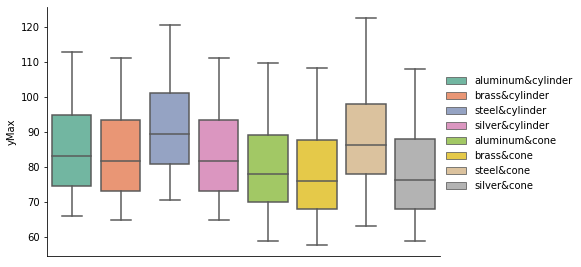

In [28]:
importlib.reload(fcs)
fig = fcs.box_plot(x='qualitaives', y='yMax', data=datas, labels=labels, n=4)

In [30]:
fig.savefig('./pic/next/real_v2/box.png')

# plot real

In [27]:
importlib.reload(fdb)
importlib.reload(fcs)
importlib.reload(obf)
obj_case = obf.branching_obj_v3_4
x1, x2 = torch.arange(0.0, 1.1, 0.1), torch.arange(0.0, 1.1, 0.1) # Base thick, Fin Height
v1, v2 = torch.arange(0.0, 1.1, 0.1), torch.arange(0.0, 1.1, 0.1) # Bottom, Top

modelType = {'QnShareFactors':2,    # 定量共享數量
            'QlShareFactors':2,     # 定性共享樹樣
            'BranchingFactors':1,   # 分支因子數量
            'NestedFactors':[2],    # 對應分支因子的巢狀因子數量
            'NFwithBFL':[[1, 2]],    # 對應分支因子下不同level巢狀因子數量
            'QnShareLevels':[x1, x2],  # 定量共享 可能數值
            'QlShareLevels':[2, 4],    # 定性共享 level數量
            'BranchingLevels':[2],     # 分支因子水準
            'NestedLevels':[[v1, v2]]    # 巢狀因子 可能數值
           }
model = GP.buildGP('Branching_Kriging', True, modelType)

showQnShareLevels = [torch.arange(0., 1.01, 0.05), torch.arange(0., 1.01, 0.05)]
showNestedLevels = [[torch.arange(0., 1.01, 0.05), torch.arange(0., 1.01, 0.05)]]

ResultM = fdb.Result_class(**modelType, model=model, obj=obj_case)
ResultM.show_levels(showQnShareLevels=showQnShareLevels, showNestedLevels=showNestedLevels)

hii fdb37
hi fcs2
hii obj30


hii obj20


D:\study\ncku\soa3\畢業\codes\gaussian_process\GPModel\functions_v2.py:30: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


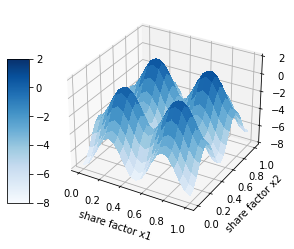

In [4]:
# max
importlib.reload(obf)
Qncha = [0, 1]
Qls = [2, 1, 2]
v1, v2 = 0.5, 1.0
Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
path = './pic/next/obj_v3-4/real/max/Ql-142_Qn-1.0-1.0_blue.png'
y, x1, x2, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=[-8, 2], cmap='Blues', file=None)

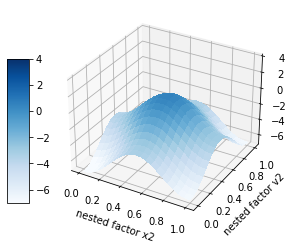

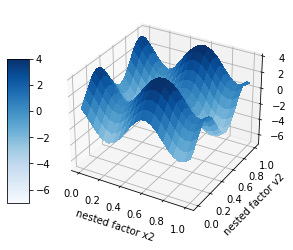

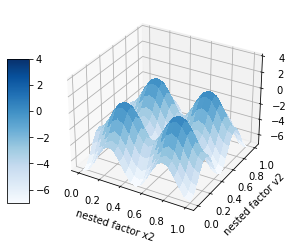

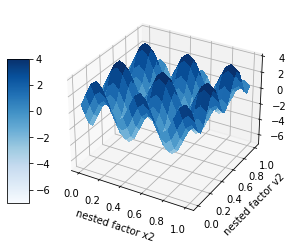

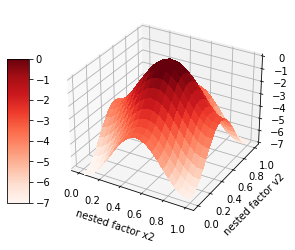

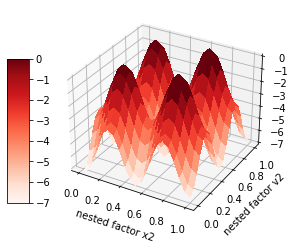

In [40]:
# 繪出所有圖 obj 3-4
# Qncha = [0, 2]
# x2, v2 = 0.0, 0.0
# Qnfix = [torch.tensor([x2]), torch.tensor([v2])]
# Zlim = [-7, 4]
# for i in range(1, 5):
#     Qls = [1, i, 2]
#     a, b, c = Qls
#     path = f'./pic/next/obj_v3-4/real/base-x1v1_fix-x2v2_chg-Ql1x2/x1v1_Ql{a}{b}{c}_x2v2-{x2}-{v2}.png'
#     y, _, _, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Blues', file=path,
#                                     xtitle='share factor x1',
#                                     ytitle='nested factor v1')

# Zlim = [-7, 0]
# for i in range(1, 3):
#     Qls = [i, 1, 2]
#     a, b, c = Qls
#     path = f'./pic/next/obj_v3-4/real/base-x1v1_fix-x2v2_chg-Qlx12/x1v1_Ql{a}{b}{c}_x2v2-{x2}-{v2}.png'
#     y, _, _, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Reds', file=path,
#                                     xtitle='share factor x1',
#                                     ytitle='nested factor v1')

#############
Qncha = [1, 3]
x1, v1 = 0.0, 0.0
Qnfix = [torch.tensor([x1]), torch.tensor([v1])]
Zlim = [-7, 4]
for i in range(1, 5):
    Qls = [1, i, 2]
    a, b, c = Qls
    path = f'./pic/next/obj_v3-4/real/base-x2v2_fix-x1v1_chg-Ql1x2/x2v2_Ql{a}{b}{c}_x1v1-{x1}-{v1}.png'
    y, _, _, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Blues', file=path,
                                  xtitle='nested factor x2',
                                  ytitle='nested factor v2')

Zlim = [-7, 0]
for i in range(1, 3):
    Qls = [i, 1, 2]
    a, b, c = Qls
    path = f'./pic/next/obj_v3-4/real/base-x2v2_fix-x1v1_chg-Qlx12/x2v2_Ql{a}{b}{c}_x1v1-{x1}-{v1}.png'
    y, _, _, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Reds', file=path,
                                    xtitle='nested factor x2',
                                    ytitle='nested factor v2')

In [28]:
# real data
importlib.reload(fdb)
importlib.reload(fcs)
importlib.reload(obf)
path = './data/real/ex.csv'
obj_case = obf.real_objs2(path).get_value
x1, x2 = torch.arange(2.2, 3.01, 0.2), torch.arange(16, 33.01, 2) # Base thick, Fin Height
v1, v2 = torch.arange(2.2, 4.01, 0.2), torch.arange(1.5, 1.91, 0.1) # Bottom, Top

modelType = {'QnShareFactors':2,    # 定量共享數量
            'QlShareFactors':2,     # 定性共享樹樣
            'BranchingFactors':1,   # 分支因子數量
            'NestedFactors':[2],    # 對應分支因子的巢狀因子數量
            'NFwithBFL':[[1, 2]],    # 對應分支因子下不同level巢狀因子數量
            'QnShareLevels':[x1, x2],  # 定量共享 可能數值
            'QlShareLevels':[1, 4],    # 定性共享 level數量
            'BranchingLevels':[2],     # 分支因子水準
            'NestedLevels':[[v1, v2]]    # 巢狀因子 可能數值
            }
model = GP.buildGP('Branching_Kriging_type2', True, modelType)

ResultM = fdb.Result_class(**modelType, model=model, obj=obj_case)

hii fdb27
hi fcs2
hii obj20


D:\study\ncku\soa3\畢業\codes\gaussian_process\GPModel\functions_v2.py:30: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


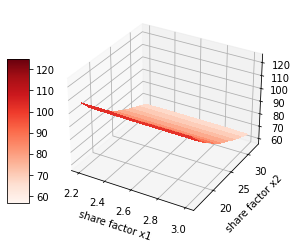

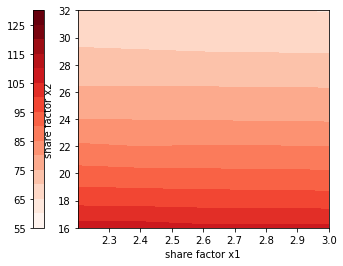

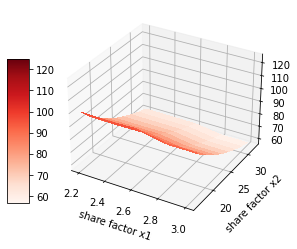

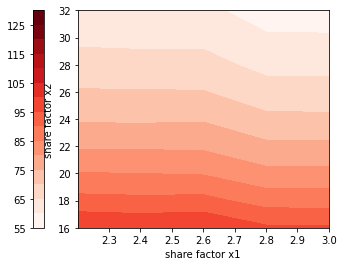

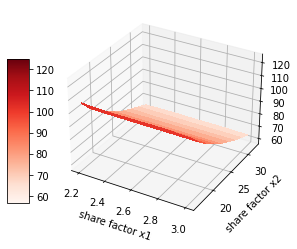

...

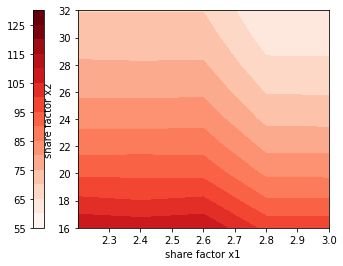

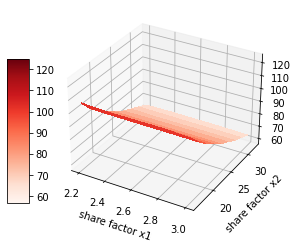

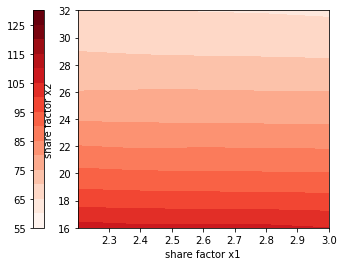

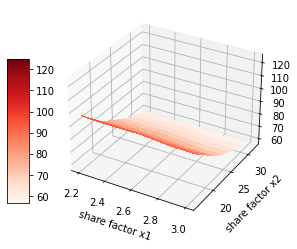

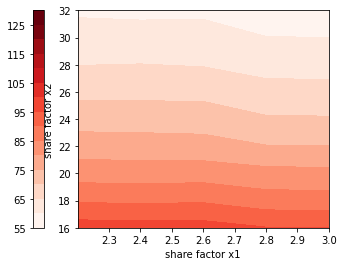

In [35]:
Qncha = [0, 1]
v1 = 4.
for i in range(1, 5):
    for j in range(1, 3):
        Qls = [1, i, j]
        a, b, c = Qls
        v2 = 1.5 if j == 2 else 0.
        Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
        Zlim = [57, 125]
        y, x1, x2, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Reds', file=None)
        fig = fcs.plot_contourf(x1, x2, y, xtitle='share factor x1', ytitle='share factor x2', Zlim=Zlim)
        path = f'./pic/next/real_v2/real/ex/base-x1x2_Qls{a}{b}{c}_v1v2{v1}{v2}.png'
        fig.savefig(path)

hi fcs2


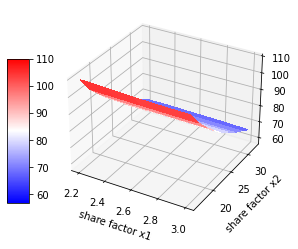

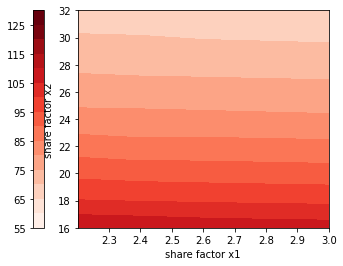

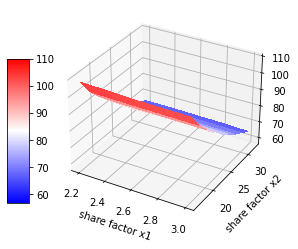

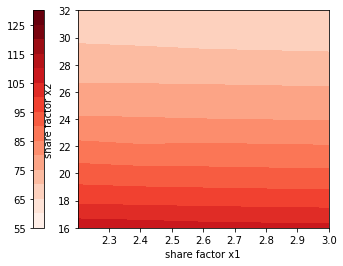

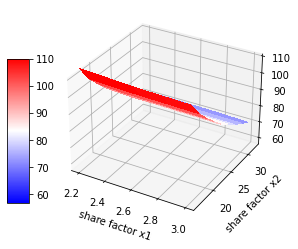

...

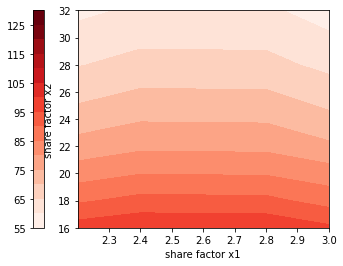

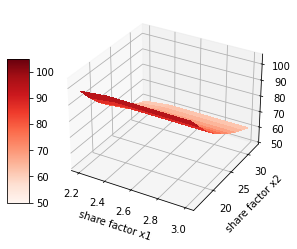

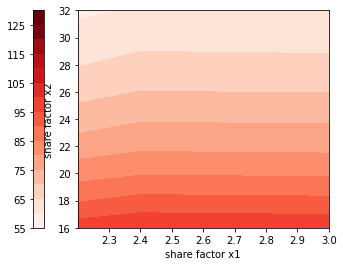

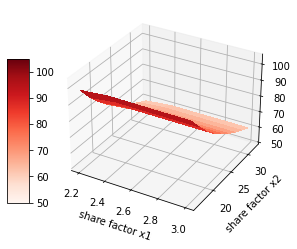

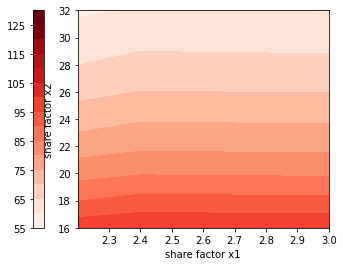

In [49]:
# 繪出所有圖
importlib.reload(fcs)
Qncha = [0, 1]
v1, v2 = 4., 0.0
Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
Zlim = [57, 110]

# for i in range(1, 2):
#     for j in range(1, 5):
#         Qls = [i, j, 1]
#         a, b, c = Qls
#         path0 = f'./pic/next/real_v2/real/fix-n1n2_chg-Ql/Ql{a}-{b}-{c}_Qn{v1}-{v2}_3d.png'
#         path = f'./pic/next/real_v2/real/fix-n1n2_chg-Ql/Ql{a}-{b}-{c}_Qn{v1}-{v2}_red.png'
#         y, x1, x2, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='bwr', file=None)
#         fig = fcs.plot_contourf(x1, x2, y, xtitle='share factor x1', ytitle='share factor x2')
#         fig.savefig(path)

# Qncha = [0, 1]
# v1, v2 = 4., 1.5
# Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
# Zlim = [50, 105]
        
# for i in range(1, 2):
#     for j in range(1, 5):
#         Qls = [i, j, 2]
#         a, b, c = Qls
#         path0 = f'./pic/next/real_v2/real/fix-n1n2_chg-Ql/Ql{a}-{b}-{c}_Qn{v1}-{v2}_3d.png'
#         path = f'./pic/next/real_v2/real/fix-n1n2_chg-Ql/Ql{a}-{b}-{c}_Qn{v1}-{v2}_red.png'
#         y, x1, x2, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='bwr', file=path0)
#         fig = fcs.plot_contourf(x1, x2, y, xtitle='share factor x1', ytitle='share factor x2')
#         fig.savefig(path)

# Qncha = [0, 1]
# Qls = [1, 3, 1]
# a, b, c = Qls
# v2 = 0.0
# k = [2.2, 2.4, 2.6, 2.8, 3.0, 3.2, 3.4, 3.6, 3.8, 4.0]
# for v1 in k:
#     Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
#     path = f'./pic/next/real_v2/real/Ql131_n1/Ql_{a}-{b}-{c}_Qn_{v1}-{v2}_red.png'
#     y, x1, x2, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Reds', file=None)
#     fig = fcs.plot_contourf(x1, x2, y, xtitle='share factor x1', ytitle='share factor x2')
#     fig.savefig(path)
    
# Qncha = [0, 1]
# Qls = [2, 3, 1]
# a, b, c = Qls
# v2 = 0.0
# k = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
# for v1 in k:
#     Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
#     path = f'./pic/next/obj_v3-4/real/Ql231_n1/Ql_{a}-{b}-{c}_Qn_{v1}-{v2}_red.png'
#     y, x1, x2, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Reds', file=path)
    
# Qncha = [0, 1]
# Qls = [1, 4, 2]
# a, b, c = Qls
# v1 = 4.
# k = [1.5, 1.6, 1.7, 1.8, 1.9]
# for v2 in k:
#     Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
#     path = f'./pic/next/real_v2/real/Ql142n1_n2/Ql_{a}-{b}-{c}_Qn_{v1}-{v2}_blue.png'
#     y, x1, x2, w = ResultM.show_real(Qncha, Qnfix, Qls, Zlim=Zlim, cmap='Reds', file=None)
#     fig = fcs.plot_contourf(x1, x2, y, xtitle='share factor x1', ytitle='share factor x2')
#     fig.savefig(path)

# plot initiall data plot

In [22]:
importlib.reload(fdb)
importlib.reload(fcs)

obj_case = fdb.branching_obj_v3_3
dataType = {'QnShareFactors':2,
            'QlShareFactors':2,
            'BranchingFactors':1,
            'QlShareLevels':[4, 4],
            'BranchingLevels':[2],
            'NestedFactors':[2]}

ns = 10

trainX = torch.load(f'./data/initDatas/obj_v3_byOPT/50_points_n{ns}_v3.pt')[0]
trainY = obj_case(fdb.dataTransfer(trainX, dataType))

hii1616


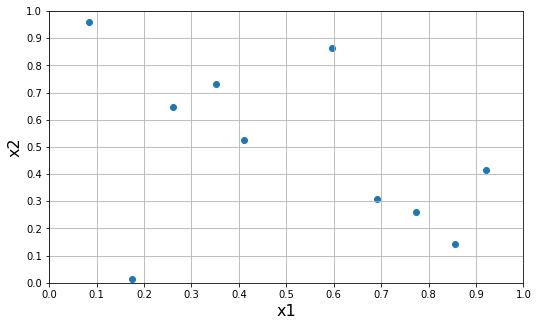

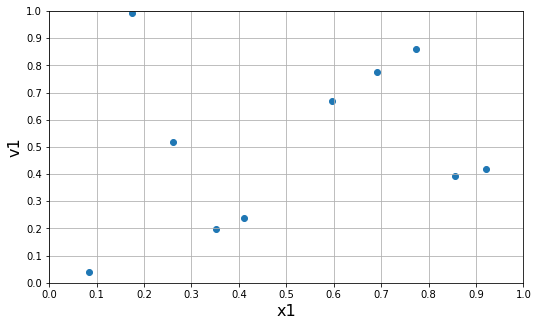

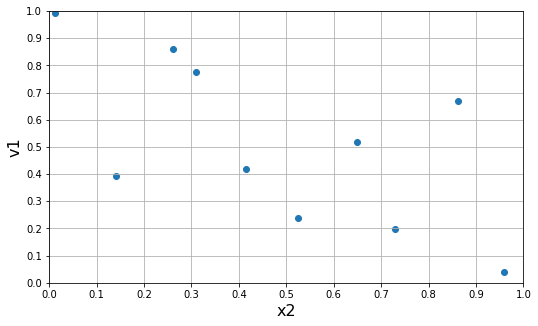

In [24]:
importlib.reload(fcs)
Qls = [1, 1, 1]
q1, q2, q3 = Qls
v1, v2 = 0.3, 0.0
Qnfix = [torch.tensor([v1]), torch.tensor([v2])]

QnRange = [[0, 1], [0, 1], [0, 1], [0, 1]]

N = 10
ticks = np.linspace(0, 1, N+1)
a = 3
b = 4 if q3 == 2 else 3
labels = ['x1', 'x2', 'v1', 'v2']
for i in range(a):
    for j in range(i+1, b):
        Qncha = [i, j]
        xlabel, ylabel = labels[i], labels[j]
        path = f'./pic/meet0318/init_points/{N}/good/Qn{i}-{j}_Ql{q1}-{q2}-{q3}_N{N}_neg'
        
        figure = fcs.initiall_contour(trainX, Qncha, Qnfix, Qls, QnRange, dataType, 
                              ticks=ticks, xlabel=xlabel, ylabel=ylabel, combin=True)
        figure.savefig(path)

# plot line chart

In [2]:
importlib.reload(utils)
path = './pic/next/result/realdata/linear/'
result1, datalist = utils.result_combin2(path)

path = './pic/next/result/realdata/nolinear/'
result2, datalist = utils.result_combin2(path)

time1, time2 = result1['time'][:, 0, 0, :], result2['time'][:, 0, 0, :]
time_result = torch.cat([time1, time2], dim=0).numpy()

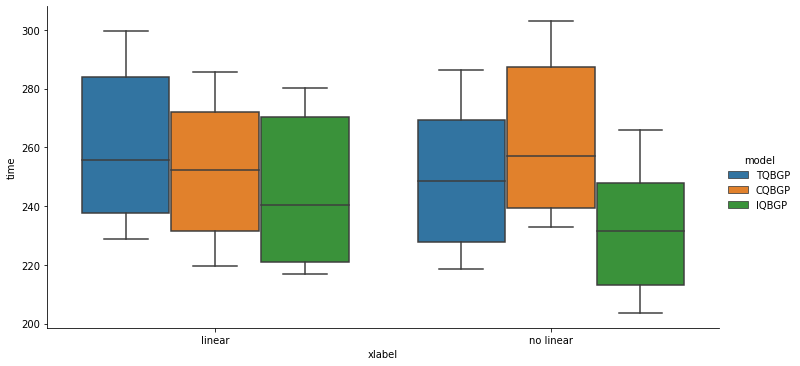

In [3]:
outputs = utils.box_for_times(time_result)
fig = sns.catplot(x="xlabel", y="time", hue='model', data=outputs, kind="box", height=5, aspect=2)
# fig.savefig(f'./pic/next/real_v2/lineChart/time.png')

In [16]:
importlib.reload(utils)
path = './pic/next/result/realdata/linear/'
# path = './pic/next/result/obj3-3/'
result, datalist = utils.result_combin2(path)

ns = 20
inputs = result['level'][:, 0, 0, :, :ns]
result['time'].shape, inputs.shape

(torch.Size([3, 1, 2, 40]), torch.Size([3, 40, 20]))

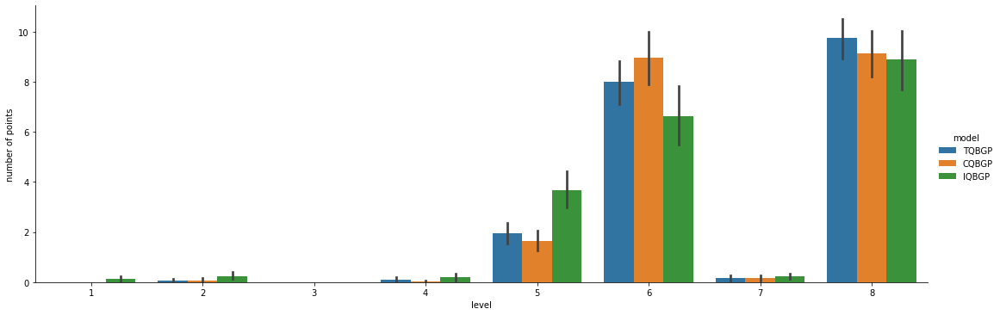

In [17]:
import seaborn as sns
outputs = utils.box_for_model_label(inputs, levelN=8)
# fig = sns.catplot(x="level", y="number of points", hue='model', data=outputs, kind="box", height=5, aspect=3)
fig = sns.catplot(x="level", y="number of points", hue='model', data=outputs, kind="bar", height=5, aspect=3)
# fig.savefig(f'./pic/next/obj_v3-4/lineChart/init240_resultbox_ns{ns}.png')
fig.savefig(f'./pic/next/real_v2/lineChart/linear/resultbar_ns{ns}.png')

In [31]:
import numpy as np
import pandas as pd
importlib.reload(utils)
path = './pic/final/result/realdata/nolinear/'
# path = './pic/next/result/obj3-4/'
result, datalist = utils.result_combin(path)
result['time'].shape

torch.Size([3, 1, 1, 40])

In [24]:
result['predMSE'].squeeze()[0, :, 43]

tensor([4.01014, 3.59283, 3.86759, 5.46039, 4.19272, 3.87840, 4.80914, 4.26515,
        4.21139, 4.87953, 5.16676, 4.88219, 5.30667, 3.93086, 4.36726, 5.09382,
        4.96175, 4.38488, 4.86340, 4.83097, 4.82696, 3.82113, 4.17447, 4.77100,
        4.43756, 3.87157, 4.47728, 4.20436, 4.42182, 4.87490, 4.58345, 4.42347,
        3.92272, 4.49499, 4.49732, 4.96715, 5.76171, 4.71621, 3.71079, 4.45017])

In [25]:
datalist[-4]

'result_data6-7.pt'

hi fcs2


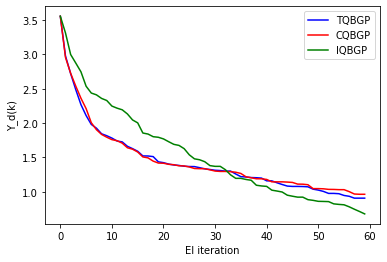

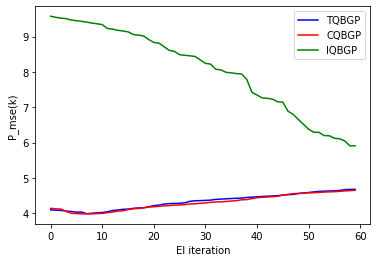

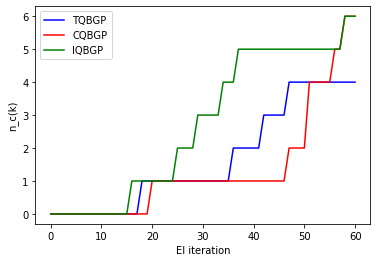

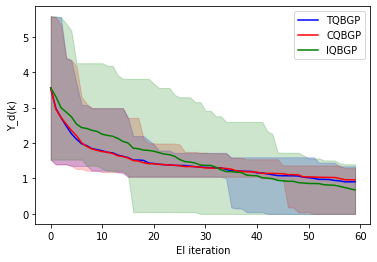

In [33]:
# real data
importlib.reload(fcs)
def EIMinResult(data):
    result = []
    for i in range(61):
        c = (data <= i).sum(dim=3)
        result.append(c.unsqueeze(dim=3))
    return torch.cat(result, dim=3)

n = 40
EIs = 60
resultgraph = {'predMSE':None, 'predMin':None, 'EIMin':None}
resultgraph['predMSE'] = result['predMSE'][:, :, :, :n, :EIs].mean(dim=3)
resultgraph['predMin'] = result['predMin'][:, :, :, :n, :EIs].mean(dim=3)
resultgraph['EIMin'] = EIMinResult(result['EIMin'][:, :, :, :n])

lineLegend = ['TQBGP', 'CQBGP', 'IQBGP']

metric = ['predMin', 'predMSE', 'EIMin']
models = ['TQBGP', 'CQBGP', 'IQBGP']
objs = ['realObj']
# objs = ['obj_v3-4']
inits = ['n10']

# d = 'obj_v3-4'
d = 'real_v2'
for _, m in enumerate(metric):
    for i, obj in enumerate(objs):
        for j, init in enumerate(inits):
            datas = resultgraph[m][0:3, i, j, :]
            if m == 'predMSE':
                ytitle = 'P_mse(k)'
                title = 'Predict MSE, ' + ' ' + init
            elif m == 'predMin':
                ytitle = 'Y_d(k)'
                title = 'Y(k), ' + ' ' + init
            elif m == 'EIMin':
                ytitle = 'n_c(k)'
                title = 'n(k), ' + ' ' + init
            
            fig = fcs.plot_multiChart(datas, lineLegend, xtitle='EI iteration', ytitle=ytitle, title=None)
            
# #             fig.savefig(f'./pic/next/{d}/lineChart/{m}-{obj}-{init}')
            fig.savefig(f'./pic/final/{d}/lineChart/nolinear/{m}-{obj}-{init}')

# multi line
# for k, m in enumerate(models):
#     for i, obj in enumerate(objs):
#         for j, init in enumerate(inits):
#             datas = result['predMin'][k, i, j, :, :EIs]
#             fig = fcs.plot_lineChart(datas, xtitle='EI iteration', ytitle='Y_d(k)')

# #             fig.savefig(f'./pic/next/{d}/lineChart/multiLine_{m}-{obj}-{init}')
# #             fig.savefig(f'./pic/next/{d}/lineChart/nolinear/multiLine_{m}-{obj}-{init}')

# line with shade
for i, obj in enumerate(objs):
    for j, init in enumerate(inits):
        datas = result['predMin'][:, i, j, :, :EIs]
        fig = fcs.plot_lineChart2(datas, lineLegend=lineLegend ,xtitle='EI iteration', ytitle='Y_d(k)',
                                  quantile=[0.05, 0.95])

#         fig.savefig(f'./pic/next/{d}/lineChart/multimodle-{obj}-{init}')
        fig.savefig(f'./pic/final/{d}/lineChart/nolinear/multimodle-{obj}-{init}')

In [2]:
import os
path1 = './pic/next/result/obj3-3/QL_parameters_TQBGP/'
path2 = './pic/next/result/obj3-4/QL_parameters_TQBGP/'
datas1 = os.listdir(path1)
datas2 = os.listdir(path2)
result1 = []
result2 = []

for i in datas1:
    result1.append(torch.load(path1 + i))
result1 = torch.cat(result1, dim=3).squeeze()
result1 = torch.permute(result1, [0, 2, 1])
result1 = result1.mean(dim=0)
result1 = result1[np.newaxis, :, :]

for i in datas2:
    result2.append(torch.load(path2 + i))
result2 = torch.cat(result2, dim=3).squeeze()
result2 = torch.permute(result2, [0, 2, 1])
result2 = result2.mean(dim=0)
result2 = result2[np.newaxis, :, :]

result = torch.cat([result1, result2], dim=0)
result.shape

torch.Size([2, 120, 61])

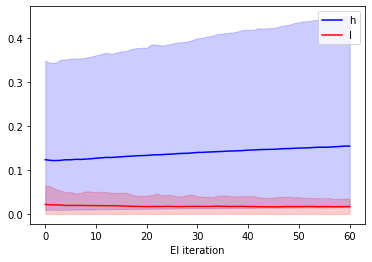

In [11]:
lineLegend = ['h', 'l']
fig = fcs.plot_lineChart2(result, lineLegend=lineLegend, quantile=[0.1, 0.9], xtitle='EI iteration')
fig.savefig('./pic/next/QLParameters_TQBGP.png')

hi fcs2


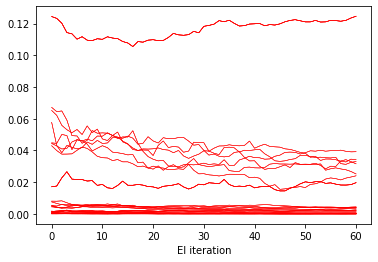

In [10]:
importlib.reload(fcs)
fig = fcs.plot_lineChart(result2.squeeze(), xtitle='EI iteration', ytitle=None, between=False, color='red')
fig.savefig('./pic/next/obj_v3-4/lineChart/QL_parameters_TQBGP.png')

# plot Pmse result

In [2]:
def funx(d):
    outputs = []
    for s in d:
        c = s.split('.')[-1]
        if c == 'pt':
            outputs.append(s)
    return outputs

In [10]:
g = 'bad'
m = 2
ds = 320
path = f'./pic/meet0304/obj_v3-2/result/m{m}_d{ds}/{g}/'
dataP = funx(os.listdir(path))

if g == 'bad':
    real = torch.load('./pic/meet0304/obj_v3-2/result/Ql_2-4-2_Qn_0.5-1.0.pt')
elif g == 'good':
    real = torch.load('./pic/meet0304/obj_v3-2/result/Ql_2-4-2_Qn_0.5-0.4.pt')
elif g == 'vg':
    real = torch.load('./pic/meet0304/obj_v3-2/result/Ql_2-4-1_Qn_1.0-0.0.pt')

real = real['real']    
for p in dataP:
    data = torch.load(path + p)
    x1, x2 = data['xy']
    pred = data['prediction'].numpy()
    
    diff = pred - real
    diff = np.sqrt((diff ** 2).mean())
    print(diff)

1.5015504
1.519096
1.5008465
1.4349072


D:\study\ncku\soa3\瑞彬\codes\gaussian_process\functions_v2.py:10: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


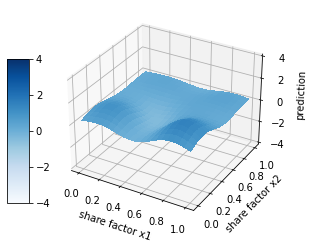

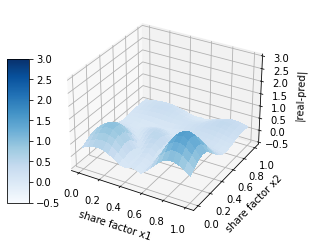

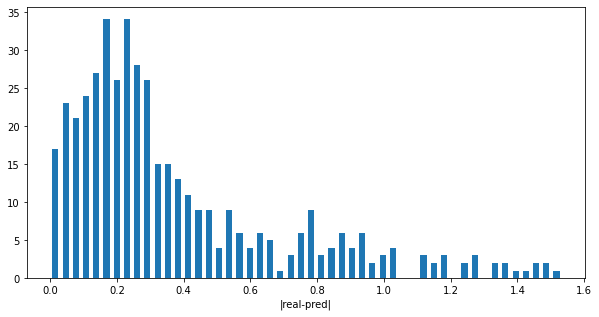

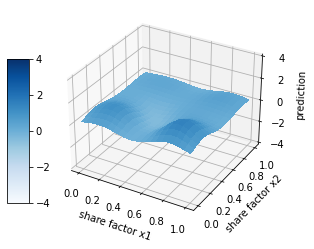

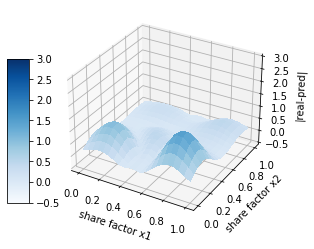

...

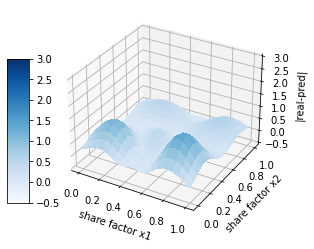

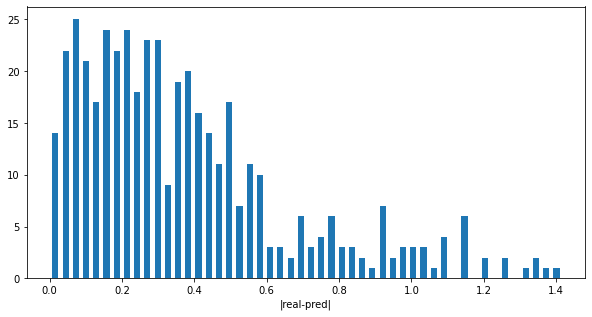

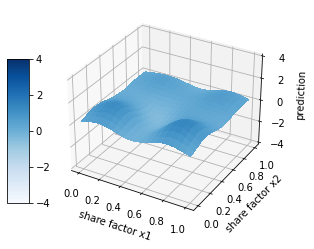

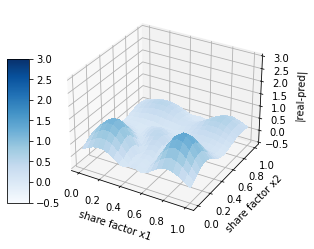

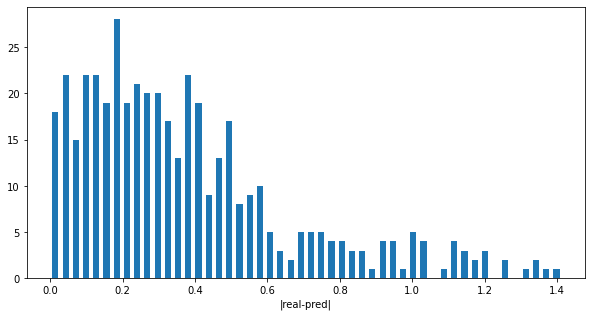

In [4]:
import os

for g in ['vg']:
    for m in [1, 2]:
        for ds in [320]:
            path = f'./pic/meet0304/obj_v3-2/result/m{m}_d{ds}/{g}/'
            dataP = funx(os.listdir(path))
            if g == 'bad':
                real = torch.load('./pic/meet0304/obj_v3-2/result/Ql_2-4-2_Qn_0.5-1.0.pt')
            elif g == 'good':
                real = torch.load('./pic/meet0304/obj_v3-2/result/Ql_2-4-2_Qn_0.5-0.4.pt')
            elif g == 'vg':
                real = torch.load('./pic/meet0304/obj_v3-2/result/Ql_2-4-1_Qn_1.0-0.0.pt')
            
            real = real['real']
            cmap = 'Blues' if g == 'good' else 'Reds' if g == 'bad' else 'Blues'
            for p in dataP:
                data = torch.load(path + p)
                x1, x2 = data['xy']
                pred = data['prediction'].numpy()
                pd = np.abs(real - pred)

                predCurve, _ = fcs.plot3d(x1, x2, pred, Zlim=[-4, 4],
                                        xtitle='share factor x1',
                                        ytitle='share factor x2', 
                                        ztitle='prediction',
                                        cmap=cmap)
                PdCurve, _ = fcs.plot3d(x1, x2, pd, Zlim=[-0.5, 3],
                                        xtitle='share factor x1',
                                        ytitle='share factor x2',
                                        ztitle='|real-pred|',
                                        cmap=cmap)

                pdhis = fcs.plot_histogram(datas=pd.reshape(-1), 
                                        xtitle='|real-pred|',
                                        density=False)

                predCurve.savefig(path + p + '.pred.png')
                PdCurve.savefig(path + p + '.pd.png')
                pdhis.savefig(path + p + '.hist.png')

# add points result

In [2]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch import optim
torch.set_printoptions(precision=5)

import importlib
from matplotlib import pyplot as plt
from matplotlib import cm

import Branching_Models_v4 as GP
import functions_v2 as fcs
import fc_data_branching_v3 as fdb
import objFun as objf

In [3]:
importlib.reload(fdb)
importlib.reload(fcs)

x1, x2 = torch.arange(0.2, 1.01, 0.2), torch.arange(0.1, 1.01, 0.1) # Base thick, Fin Height
v1, v2 = torch.arange(0.1, 1.01, 0.1), torch.arange(0.2, 1.01, 0.2) # Bottom, Top
modelType = {'QnShareFactors':2,    # 定量共享數量
            'QlShareFactors':2,     # 定性共享樹樣
            'BranchingFactors':1,   # 分支因子數量
            'NestedFactors':[2],    # 對應分支因子的巢狀因子數量
            'NFwithBFL':[[1, 2]],    # 對應分支因子下不同level巢狀因子數量
            'QnShareLevels':[x1, x2],  # 定量共享 可能數值
            'QlShareLevels':[2, 4],    # 定性共享 level數量
            'BranchingLevels':[2],     # 分支因子水準
            'NestedLevels':[[v1, v2]]    # 巢狀因子 可能數值
            }

# settiing
obj_cases = [objf.branching_obj_v3_3, objf.branching_obj_v3_4]
models = [GP.Branching_Kriging, GP.Branching_Kriging_type2, GP.Branching_Kriging_ind]
trainDataPaths = ['./pic/next/result/datas/simulation/points_n20_v3.pt']

savedir = './pic/next/result/addpoints/'

for i, m in enumerate(models):
    for j, obj in enumerate(obj_cases):
        for k, dp in enumerate(trainDataPaths):
            savepath = savedir + f'm{i}-obj{j}-dp{k}/'
            if not os.path.isdir(savepath):
                os.mkdir(savepath)
            
#             model = m(**modelType)
#             obj_case = obj
#             trainX = torch.load(dp)[0]
            
#             trainY = obj_case(fdb.dataTransfer(trainX, modelType))
#             model.get_obj(obj_case)
#             model.train_datas(trainX=trainX, trainY=trainY)
#             optimizer = optim.Adam(model.parameters(), lr=0.1, betas=(0.9, 0.999))
#             GP.train(model, optimizer, 1000, show=False)
            
#             showQnShareLevels = [torch.arange(0., 1.01, 0.05), torch.arange(0., 1.01, 0.05)]
#             ResultM = fdb.Result_class(**modelType, model=model, obj=obj_case)
#             ResultM.show_levels(showQnShareLevels=showQnShareLevels)
            
#             # 資料
#             Qncha = [0, 1]
#             Qls = [1, 4, 2]
#             v1, v2 = [0.5, 0.4] if j == 0 else [1.0, 1.0]
#             Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
#             a, b, c = Qls
            
#             predpath = savepath + f'm{i}-obj{j}-dp{k}_EI{0}.pt'
#             ResultM.get_plot(Qncha, Qnfix, Qls,
#                              predCurve=True,
#                              predLim=None, EILim=None,
#                              loadData=predpath,
#                              cmap='Blues')

#             for l in range(1, 51):
#                 print(l)
#                 orignPoints, newPoints = GP.train_new_points(model, optimizer, 50, 1)
#                 if l % 2 == 0:
#                     predpath = savepath + f'./m{i}-obj{j}-dp{k}_EI{l}.pt'
#                     ResultM.get_plot(Qncha, Qnfix, Qls,
#                                      predCurve=True,
#                                      predLim=None, EILim=None,
#                                      loadData=predpath,
#                                      cmap='Blues')

hii fdb
hi fcs


In [ ]:
# real data v2

importlib.reload(fdb)
importlib.reload(fcs)

x1, x2 = torch.arange(2.2, 3.01, 0.2), torch.arange(16, 34.01, 2) # Base thick, Fin Height
v1, v2 = torch.arange(2.2, 4.01, 0.2), torch.arange(1.5, 1.91, 0.1) # Bottom, Top
modelType = {'QnShareFactors':2,    # 定量共享數量
            'QlShareFactors':2,     # 定性共享樹樣
            'BranchingFactors':1,   # 分支因子數量
            'NestedFactors':[2],    # 對應分支因子的巢狀因子數量
            'NFwithBFL':[[1, 2]],    # 對應分支因子下不同level巢狀因子數量
            'QnShareLevels':[x1, x2],  # 定量共享 可能數值
            'QlShareLevels':[1, 4],    # 定性共享 level數量
            'BranchingLevels':[2],     # 分支因子水準
            'NestedLevels':[[v1, v2]]    # 巢狀因子 可能數值
            }

# settiing
path = './data/real/ex.csv'
obj_case = objf.real_objs2(path).get_value

obj_cases = [obj_case]
models = [GP.Branching_Kriging, GP.Branching_Kriging_type2, GP.Branching_Kriging_ind]
trainDataPaths = ['./data/real/50_points_n3_realv2.pt',
          './data/real/50_points_n5_realv2.pt']

savedir = './pic/meet0408/result/realdata/addpoints/'

for i, m in enumerate(models):
    for j, obj in enumerate(obj_cases):
        for k, dp in enumerate(trainDataPaths):
            savepath = savedir + f'm{i}-obj{j}-dp{k}/'
            if not os.path.isdir(savepath):
                os.mkdir(savepath)
            
            model = m(**modelType)
            obj_case = obj
            trainX = torch.load(dp)[0]
            
            trainY = obj_case(fdb.dataTransfer(trainX, modelType))
            model.get_obj(obj_case)
            model.train_datas(trainX=trainX, trainY=trainY)
            optimizer = optim.Adam(model.parameters(), lr=0.1, betas=(0.9, 0.999))
            GP.train(model, optimizer, 1000, show=False)
            
            showQnShareLevels = [torch.arange(2.2, 3.01, 0.2), torch.arange(16, 34.01, 2)]
            ResultM = fdb.Result_class(**modelType, model=model, obj=obj_case)
            ResultM.show_levels(showQnShareLevels=showQnShareLevels)
            
            # 資料
            Qncha = [0, 1]
            Qls = [1, 2, 1]
            v1, v2 = [4., 0.]
            Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
            a, b, c = Qls
            
            predpath = savepath + f'./real-obj{j}-dp{k}_EI{0}.pt'
            ResultM.get_plot(Qncha, Qnfix, Qls,
                             predCurve=True,
                             predLim=None, EILim=None,
                             loadData=predpath,
                             cmap='Blues')

            for l in range(1, 61):
                print(l)
                orignPoints, newPoints = GP.train_new_points(model, optimizer, 50, 1)
                if l % 10 == 0:
                    predpath = savepath + f'./real-obj{j}-dp{k}_EI{l}.pt'
                    ResultM.get_plot(Qncha, Qnfix, Qls,
                                     predCurve=True,
                                     predLim=None, EILim=None,
                                     loadData=predpath,
                                     cmap='Blues')

hii fdb
hi fcs


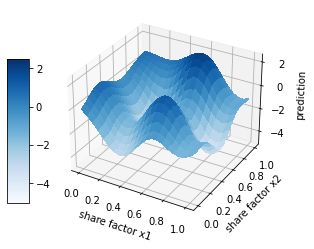

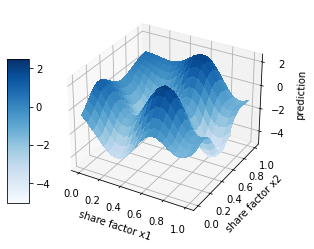

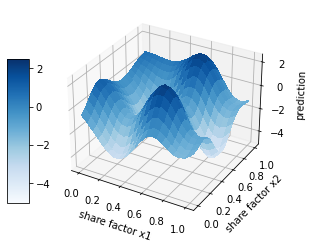

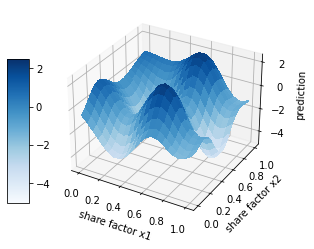

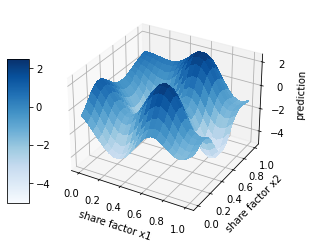

...

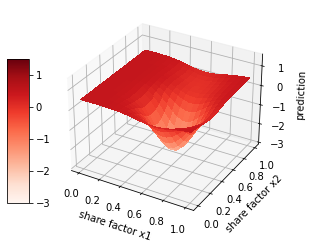

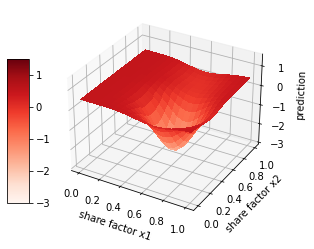

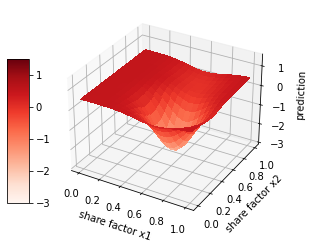

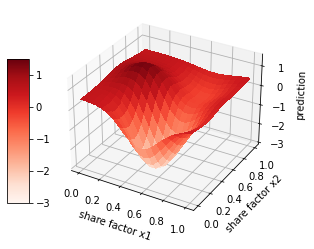

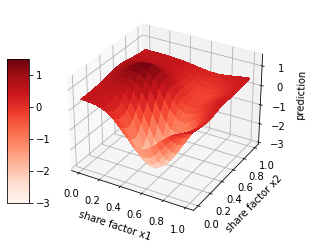

In [11]:
importlib.reload(fdb)
importlib.reload(fcs)

# 使用資料畫圖
def funx(d):
    outputs = []
    for s in d:
        c = s.split('.')[-1]
        if c == 'pt':
            outputs.append(s)
    return outputs

# settiing
obj_cases = [objf.branching_obj_v3_3, objf.branching_obj_v3_4]
models = [GP.Branching_Kriging, GP.Branching_Kriging_type2, GP.Branching_Kriging_ind]
trainDataPaths = ['./pic/next/result/datas/simulation/points_n20_v3.pt']

savedir = './pic/next/result/addpoints/'

for i, m in enumerate(models):
    for j, obj in enumerate(obj_cases):
        for k, dp in enumerate(trainDataPaths):
            savepath = savedir + f'm{i}-obj{j}-dp{k}/'
            dataP = funx(os.listdir(savepath))
            cmap = 'Blues' if j == 0 else 'Reds'
            
            Qncha = [0, 1]
            Qls = [1, 4, 2]
            v1, v2 = [0.5, 0.4] if j == 0 else [1.0, 1.0]
            Zlim = [-5, 2.5] if j == 0 else [-3, 1.5]
            Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
            a, b, c = Qls
            
            for l, p in enumerate(dataP):
                data = torch.load(savepath + p)
                x1, x2 = data['xy']
                pred = data['prediction'].numpy()
                predpath = savepath + f'm{i}-obj{j}-dp{k}_EI{l * 2}.png'
                predCurve, _ = fcs.plot3d(x1, x2, pred, Zlim=Zlim,
                            xtitle='share factor x1',
                            ytitle='share factor x2', 
                            ztitle='prediction',
                            cmap=cmap)
                
                predCurve.savefig(predpath)

hii


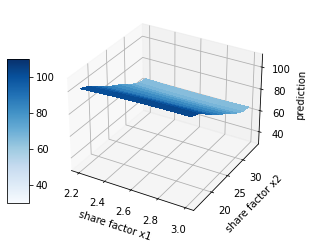

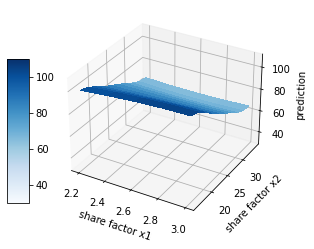

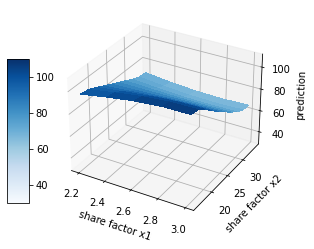

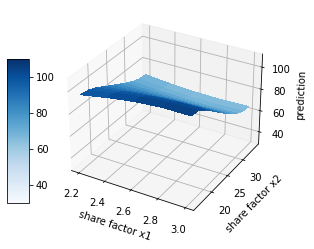

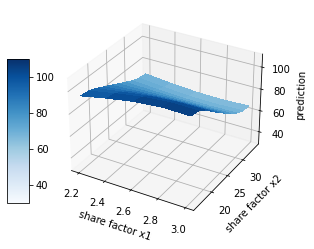

...

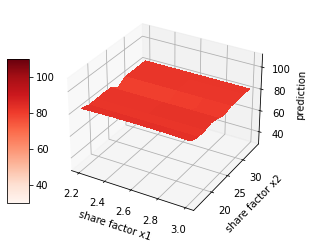

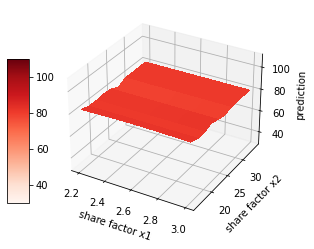

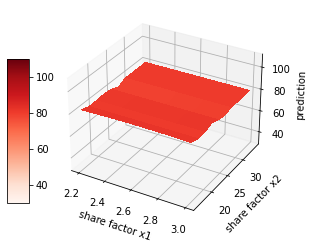

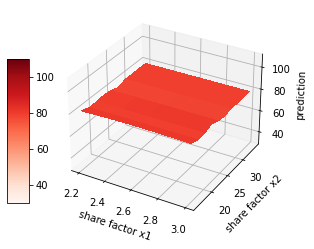

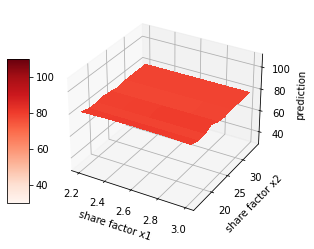

In [28]:
importlib.reload(fdb)
importlib.reload(fcs)

# 使用real資料畫圖
def funx(d):
    outputs = []
    for s in d:
        c = s.split('.')[-1]
        if c == 'pt':
            outputs.append(s)
    return outputs

# settiing
# settiing
path = './data/real/ex.csv'
obj_case = objf.real_objs2(path).get_value

obj_cases = [obj_case]
models = [GP.Branching_Kriging, GP.Branching_Kriging_type2, GP.Branching_Kriging_ind]
trainDataPaths = ['./data/real/50_points_n3_realv2.pt',
                  './data/real/50_points_n5_realv2.pt']

savedir = './pic/meet0408/result/realdata/addpoints/'

for i, m in enumerate(models):
    for j, obj in enumerate(obj_cases):
        for k, dp in enumerate(trainDataPaths):
            savepath = savedir + f'm{i}-obj{j}-dp{k}/'
            dataP = funx(os.listdir(savepath))
            cmap = 'Blues' if k == 0 else 'Reds'
            
            Qncha = [0, 1]
            Qls = [1, 2, 1]
            v1, v2 = [4.0, 0.0]
            Qnfix = [torch.tensor([v1]), torch.tensor([v2])]
            a, b, c = Qls
            
            

            for l, p in enumerate(dataP):
                data = torch.load(savepath + p)
                x1, x2 = data['xy']
                pred = data['prediction'].numpy()
                predpath = savepath + f'm{i}-obj{j}-dp{k}_EI{l * 10}.png'
                predCurve, _ = fcs.plot3d(x1, x2, pred, Zlim=[30, 110],
                            xtitle='share factor x1',
                            ytitle='share factor x2', 
                            ztitle='prediction',
                            cmap=cmap)
                
                predCurve.savefig(predpath)

# try

In [47]:
x = np.arange(0, 1.01, 0.01)
v = np.arange(0, 1.01, 0.01)
x, v = np.meshgrid(x, v)
xd, vd = torch.tensor(x).view(-1, 1), torch.tensor(v).view(-1, 1)
data = torch.cat([xd, vd], dim=1)
xd, vd = (2 * x - 1), (2 * v - 1)
y = 20 + ((xd) ** 2 + (vd) ** 2) - 10 * (np.cos(2 * np.pi * xd) + np.cos(2 * np.pi * vd))
y1 = 20 + (0.01 * (x - 0.5)) ** 2 + (0.01 * (v - 0.5)) ** 2 - 10 * np.cos(2 * np.pi * (x - 0.5) * 0.01) - 10 * np.cos(2 * np.pi * (v - 0.5) * 0.01)
y2 = (3 * (x - 0.5) ** 2) + 3 * ((v - 0.5) ** 2) + 1
y3 = (6 * (x - 0.5) ** 2) + 6 * ((v - 0.5) ** 2)

<ipython-input-2-23264a6ea9e6>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


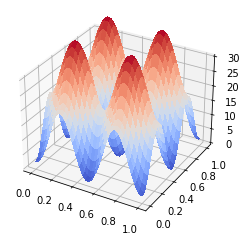

In [48]:
fig = plot3d(x, v, y, Zlim=[0, 30])

NameError: name 'get_test_data' is not defined

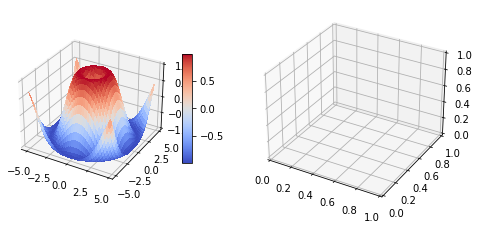

In [51]:
fig = plt.figure(figsize=plt.figaspect(0.5))

#---- First subplot
ax = fig.add_subplot(1, 2, 1, projection='3d')
X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)
surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
ax.set_zlim3d(-1.01, 1.01)

fig.colorbar(surf, shrink=0.5, aspect=10)

#---- Second subplot
ax = fig.add_subplot(1, 2, 2, projection='3d')
X, Y, Z = get_test_data(0.05)
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)

plt.show()

In [10]:
g = []
for i in range(1, 3):
    for j in range(1, 5):
        for k in range(1, 3):
            level = [i, j, k]
            p = f'./pic/meet0111/obj1/real/level_{i}-{j}-{k}.png'
            img = plt.imread(p)
            g.append(img)

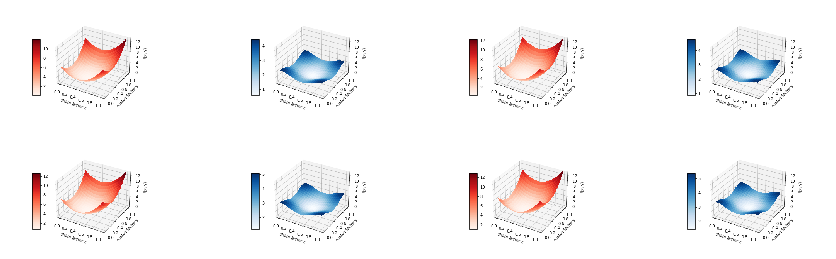

In [15]:
importlib.reload(fcs)
f = fcs.plotpics(g[:8], picNumber = [2, 4])
f.savefig('./pic/meet0111/obj1/real/plot_z_1.png')

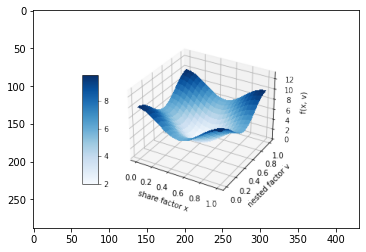

In [9]:
plt.imshow(img)

# try

In [86]:
x = np.arange(0, 1.01, 0.01)
v = np.arange(0, 1.01, 0.01)
x, v = np.meshgrid(x, v)
xd, vd = torch.tensor(x).view(-1, 1), torch.tensor(v).view(-1, 1)
data = torch.cat([xd, vd], dim=1)
y1 = (x - 0.5) ** 2 + (v - 0.5) ** 2 + 0.2
y2 = (2 * (x - 0.5) ** 2) + 2 * ((v - 0.5) ** 2)

<ipython-input-87-6ba8676bd466>:2: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


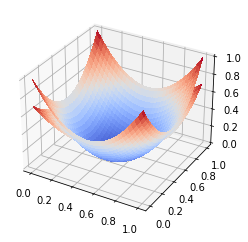

In [87]:
fig = plt.figure()
ax = fig.gca(projection='3d')

# Plot the surface.
surf = ax.plot_surface(x, v, y1, cmap=cm.coolwarm,
                    linewidth=0, antialiased=False)
surf2 = ax.plot_surface(x, v, y2, cmap=cm.coolwarm,
                    linewidth=0, antialiased=False)
plt.show()

<ipython-input-65-c64170cf4e51>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


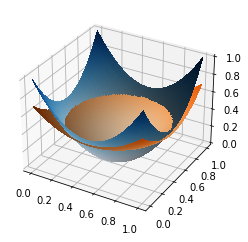

In [65]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
from scipy.special import erf

fig = plt.figure()
ax = fig.gca(projection='3d')

X = np.arange(0, 1.01, 0.01)
Y = np.arange(0, 1.01, 0.01)
X, Y = np.meshgrid(X, Y)

Z1 = np.empty_like(X)
Z2 = np.empty_like(X)
C1 = np.empty_like(X, dtype=object)
C2 = np.empty_like(X, dtype=object)

for i in range(len(X)):
    for j in range(len(X[0])):
        z1 = (X[i, j] - 0.5) ** 2 + (Y[i, j] - 0.5) ** 2 + 0.2
        z2 = (2 * (X[i, j] - 0.5) ** 2) + 2 * ((Y[i, j] - 0.5) ** 2)
        Z1[i,j] = z1
        Z2[i,j] = z2

        # If you want to grab a colour from a matplotlib cmap function, 
        # you need to give it a number between 0 and 1. z1 and z2 are 
        # already in this range, so it just works as is.
        C1[i,j] = plt.get_cmap("Oranges")(z1)
        C2[i,j] = plt.get_cmap("Blues")(z2)


# Create a transparent bridge region
X_bridge = np.vstack([X[-1,:],X[-1,:]])
Y_bridge = np.vstack([Y[-1,:],Y[-1,:]])
Z_bridge = np.vstack([Z1[-1,:],Z2[-1,:]])
color_bridge = np.empty_like(Z_bridge, dtype=object)

color_bridge.fill((1,1,1,0)) # RGBA colour, onlt the last component matters - it represents the alpha / opacity.

# Join the two surfaces flipping one of them (using also the bridge)
X_full = np.vstack([X, X_bridge, np.flipud(X)])
Y_full = np.vstack([Y, Y_bridge, np.flipud(Y)])
Z_full = np.vstack([Z1, Z_bridge, np.flipud(Z2)])
color_full = np.vstack([C1, color_bridge, np.flipud(C2)])

surf_full = ax.plot_surface(X_full, Y_full, Z_full, rstride=1, cstride=1,
                            facecolors=color_full, linewidth=0,
                            antialiased=False)

plt.show()

In [68]:
X_full.shape, Y_full.shape, Z_full.shape

((204, 101), (204, 101), (204, 101))

In [72]:
X, X.shape

(array([[0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        ...,
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ]]),
 (101, 101))

In [73]:
X_bridge, X_bridge.shape

(array([[0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
         0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
         0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
         0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
         0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54,
         0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65,
         0.66, 0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76,
         0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87,
         0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98,
         0.99, 1.  ],
        [0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
         0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
         0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
         0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
   

In [75]:
np.flipud(X), np.flipud(X).shape

(array([[0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        ...,
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
        [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ]]),
 (101, 101))

In [76]:
X_full

array([[0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
       [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
       [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
       ...,
       [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
       [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ],
       [0.  , 0.01, 0.02, ..., 0.98, 0.99, 1.  ]])

In [1]:
import Branching_Models_v3 as GP
import numpy as np
import torch
import torch.nn as nn
from torch import optim
import importlib
from matplotlib import pyplot as plt

torch.set_printoptions(precision=5)

from matplotlib import cm

import functions_v2 as fcs
import fc_data_branching_v2 as fdb

In [2]:
importlib.reload(fdb)
importlib.reload(fcs)

obj_case = fdb.branching_obj_bowl_v2
dataType = {'QnShareFactors':1,
            'QlShareFactors':1,
            'BranchingFactors':1,
            'QlLevels':[2],
            'branchingLevels':[3],
            'nestedFactors':[1]}

# datas = []
# for i in range(50):
#     datas.append(fdb.initial_datas_bowl_v2(5))
# torch.save(datas, './data/initDatas/50_points30_v2.pt')

for i in range(12):
    print(f'data{i}---------------------------')
    trainX = torch.load('./data/initDatas/50_points30_v2.pt')[i]
    trainY = obj_case(fdb.dataTransfer(trainX, dataType))

    # define model data type
    importlib.reload(GP)
    modelType = 'Branching_Kriging'
    dataType = {'QnShareFactors':1,
                'QlShareFactors':1,
                'BranchingFactors':1,
                'QlLevels':[2],
                'branchingLevels':[3],
                'nestedFactors':[1]}

    if modelType == 'Branching_Kriging':
        model = GP.Branching_Kriging(**dataType)

    elif modelType == 'Branching_GP':
        model = GP.Branching_GP(**modelDataType)

    model.get_obj(obj_case)
    model.train_datas(trainX=trainX, trainY=trainY)
    optimizer = optim.Adam(model.parameters(), lr=0.1, betas=(0.9, 0.999))

    GP.train(model, optimizer, 1000, show=False)
    model.print_parameters()
    print('get new point---------------')
    orignPoints, newPoints = GP.train_new_points(model, optimizer, 50, 1)
    print(newPoints)
    model.print_parameters()

data0---------------------------
alpha: tensor([[10.12697]])
theta: tensor([[1.35732]])
noiseSigma: tensor([[1.00000e-06]])
gamma:
tensor([[30.00000, 30.00000,  9.31438]])
tau
tensor([[1.00000, 0.94847],
        [0.94847, 1.00000]])
get new point---------------
tensor([[0.50000, 1.00000, 3.00000, 0.50000]])
alpha: tensor([[9.73813]])
theta: tensor([[1.36753]])
noiseSigma: tensor([[1.00000e-06]])
gamma:
tensor([[30.00000, 30.00000,  9.29397]])
tau
tensor([[1.00000, 0.92914],
        [0.92914, 1.00000]])
data1---------------------------
alpha: tensor([[16.89267]])
theta: tensor([[2.85112]])
noiseSigma: tensor([[1.00000e-06]])
gamma:
tensor([[19.68513, 14.81312, 15.10569]])
tau
tensor([[1.00000, 0.09784],
        [0.09784, 1.00000]])
get new point---------------
tensor([[0.45000, 2.00000, 3.00000, 0.45000]])
alpha: tensor([[17.19103]])
theta: tensor([[3.25903]])
noiseSigma: tensor([[1.00000e-06]])
gamma:
tensor([[20.13760, 15.06095, 15.08625]])
tau
tensor([[1.00000, 0.07258],
        [0.0